# LSTM (Tiltmeter)

In [32]:
#importing libraries
from math import sqrt
from numpy import concatenate
from matplotlib import pyplot
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
import pandas as pd
from keras.callbacks import EarlyStopping
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam
from keras.optimizers import SGD

In [33]:
# Loading data from Excel file
file_path = "/content/TM_combine_data.xlsx"
dataset = pd.read_excel(file_path, header=0, index_col=0)
dataset.shape

(2508, 30)

In [34]:
dataset.head()

,TM01-Reading-A (kSinα),TM01-Reading-B (kSinα),TM01-Reading-C (C),TM02-Reading-A (kSinα),TM02-Reading-B (kSinα),TM02-Reading-C (C),TM03-Reading-A (),TM03-Reading-B (),TM03-Reading-C (),TM04-Reading-A (),...,TM07-Reading-C (),TM08-Reading-A (),TM08-Reading-B (),TM08-Reading-C (),TM09-Reading-A (),TM09-Reading-B (),TM09-Reading-C (),TM10-Reading-A (),TM10-Reading-B (),TM10-Reading-C ()
Date Time (UTC+08:00),,,,,,,,,,,,,,,,,,,,,
2023-11-24 20:00:00,-0.003135,-0.001475,9.222786,-0.000827,-0.000496,9.861942,-0.012138,-0.023568,9.538295,-0.005985,...,10.77112,-0.001231,-0.000132,8.219155,0.000548,0.004505,8.095653,-0.006048,-0.000024,8.985837
2023-11-24 20:15:00,-0.003162,-0.000880,9.013208,0.000622,-0.000892,9.826522,-0.013166,-0.022269,9.537370,-0.004983,...,10.68899,-0.000553,-0.000013,7.971274,0.000520,0.003828,7.973085,-0.006501,-0.000580,8.768212
2023-11-24 20:30:00,-0.003775,-0.001939,8.640187,-0.001099,-0.001413,9.724985,-0.012454,-0.023707,9.416040,-0.004660,...,10.60634,-0.000200,0.001187,7.748508,0.000553,0.005221,7.923625,-0.006468,0.002292,8.771026
2023-11-24 20:45:00,-0.004142,-0.001236,8.290248,-0.000495,-0.001939,9.660006,-0.013076,-0.021420,9.291079,-0.003670,...,10.57546,-0.000839,0.000453,7.478624,0.000568,0.005067,7.865380,-0.005575,0.001432,8.754858
2023-11-24 21:00:00,-0.003920,-0.000346,8.144806,-0.001645,-0.001826,9.516470,-0.012219,-0.023132,9.084087,-0.005836,...,10.52408,-0.000899,0.000351,7.452027,0.000582,0.004462,7.726236,-0.006443,0.001414,8.668870


In [35]:
values = dataset.values
print(type(values))
print(values[0])

<class 'numpy.ndarray'>
[-3.13500000e-03 -1.47500000e-03  9.22278590e+00 -8.27000000e-04
 -4.96000000e-04  9.86194230e+00 -1.21380000e-02 -2.35680000e-02
  9.53829480e+00 -5.98500000e-03  1.07400000e-03  1.13733702e+01
 -4.52900000e-03 -2.70400000e-03  1.04083700e+01 -3.88000000e-04
  2.09000000e-04  1.09345703e+01 -4.71200000e-03  3.50000000e-04
  1.07711201e+01 -1.23100000e-03 -1.32000000e-04  8.21915530e+00
  5.48000000e-04  4.50500000e-03  8.09565350e+00 -6.04800000e-03
 -2.40000000e-05  8.98583700e+00]


In [36]:
scaler = StandardScaler()
scaled = scaler.fit_transform(values)
print(scaled[:2,:])

[[-0.03552247  1.27626332 -0.04080008 -1.87551416  0.46862156  0.19066079
   1.01886014  0.54298373  0.28291377  0.01080368  0.30009416  0.23816735
   0.04669526  0.44235557  0.18717644 -2.10660012  1.72286061  0.11117103
   0.66996779  0.67242488  0.15949167  0.89106334 -1.10017413 -0.03706904
   0.50395995  1.83935571  0.09733457  1.44965802 -0.37972263  0.72691809]
 [-0.03801241  1.33901868 -0.06425671 -1.27271146  0.35719308  0.18421954
   0.90559214  0.73517673  0.28273871  0.16541921 -0.34203242  0.23188038
   0.06173377  0.40929244  0.17341765 -1.81837366  1.66456453  0.0824952
   0.69359173  1.14276999  0.14411647  1.28015174 -1.07641816 -0.06761395
   0.4627723   1.79640096  0.07695005  1.37920424 -0.50539338  0.66164401]]


In [37]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = data.shape[1]
    df = DataFrame(data)
    cols, names = list(), list()

    # Input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]

    # Forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]

    # Putting it all together
    agg = concat(cols, axis=1)
    agg.columns = names
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [38]:
n_previous = 10
n_features = 30
reframed = series_to_supervised(scaled, n_previous, 1)
reframed.head()

,var1(t-10),var2(t-10),var3(t-10),var4(t-10),var5(t-10),var6(t-10),var7(t-10),var8(t-10),var9(t-10),var10(t-10),...,var21(t),var22(t),var23(t),var24(t),var25(t),var26(t),var27(t),var28(t),var29(t),var30(t)
10,-0.035522,1.276263,-0.040800,-1.875514,0.468622,0.190661,1.018860,0.542984,0.282914,0.010804,...,0.059227,1.168820,-0.890163,-0.228971,0.706956,1.984970,-0.078934,1.002362,-0.459510,0.476141
11,-0.038012,1.339019,-0.064257,-1.272711,0.357193,0.184220,0.905592,0.735177,0.282739,0.165419,...,0.045121,0.070994,-0.598704,-0.224155,0.789332,2.068976,-0.069192,0.957881,-0.361867,0.512378
12,-0.094543,1.227325,-0.106007,-1.988670,0.210591,0.165755,0.984042,0.522418,0.259780,0.215260,...,0.040175,0.505992,-0.642622,-0.256676,0.633407,1.945886,-0.070979,0.963014,-0.643270,0.549396
13,-0.128388,1.301471,-0.145173,-1.737398,0.062583,0.153938,0.915509,0.860790,0.236134,0.368024,...,0.031569,0.505418,-0.734252,-0.269293,0.699601,2.015997,-0.087327,0.954615,-0.672201,0.521993
14,-0.107915,1.395340,-0.161451,-2.215813,0.094379,0.127836,1.009935,0.607492,0.196966,0.033795,...,0.001309,1.252032,-0.688138,-0.286283,0.704014,2.004893,-0.108610,1.028024,-0.605749,0.503732


In [39]:
values = reframed.values
values.shape

(2431, 330)

In [40]:
split_ratio = 0.7
n_train_samples = int(len(values) * split_ratio)

In [41]:
train = values[:n_train_samples, :]
test = values[n_train_samples:, :]
print("size of training and testing dataset :",train.shape,test.shape)

size of training and testing dataset : (1701, 330) (730, 330)


In [42]:
n_obs = n_previous * n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features:]
test_X, test_y = test[:, :n_obs], test[:, -n_features:]
print(f"n_obs={n_obs}\ntrain_X shape: {train_X.shape}, \ntrain_y shape: {train_y.shape} \ntest_X.shape: {test_X.shape} \ntest_y.shape: {test_y.shape} ")

n_obs=300
train_X shape: (1701, 300), 
train_y shape: (1701, 30) 
test_X.shape: (730, 300) 
test_y.shape: (730, 30) 


In [43]:
train_X = train_X.reshape((train_X.shape[0], n_previous, n_features))
test_X = test_X.reshape((test_X.shape[0], n_previous, n_features))
print(train_X.shape)
print(train_y.shape)
print(test_X.shape)
print(test_y.shape)

(1701, 10, 30)
(1701, 30)
(730, 10, 30)
(730, 30)


In [44]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Bidirectional

model = Sequential()
model.add(Bidirectional(LSTM(128, return_sequences=True,activation='relu'), input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(LSTM(64))
model.add(Dropout(0.5))
model.add(Dense(n_features))
model.compile(loss='mae', optimizer="adam", metrics=['mae'])


In [45]:
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

In [46]:
history = model.fit(train_X, train_y, epochs=50, batch_size=36, validation_data=(test_X, test_y), verbose=2, shuffle=False,callbacks=early_stopping)

Epoch 1/50
48/48 - 8s - loss: 0.5812 - mae: 0.5812 - val_loss: 0.7520 - val_mae: 0.7520 - 8s/epoch - 171ms/step
Epoch 2/50
48/48 - 4s - loss: 0.4751 - mae: 0.4751 - val_loss: 0.7179 - val_mae: 0.7179 - 4s/epoch - 80ms/step
Epoch 3/50
48/48 - 5s - loss: 0.4214 - mae: 0.4214 - val_loss: 0.7020 - val_mae: 0.7020 - 5s/epoch - 106ms/step
Epoch 4/50
48/48 - 5s - loss: 0.3846 - mae: 0.3846 - val_loss: 0.6942 - val_mae: 0.6942 - 5s/epoch - 106ms/step
Epoch 5/50
48/48 - 4s - loss: 0.3555 - mae: 0.3555 - val_loss: 0.6899 - val_mae: 0.6899 - 4s/epoch - 79ms/step
Epoch 6/50
48/48 - 4s - loss: 0.3387 - mae: 0.3387 - val_loss: 0.6855 - val_mae: 0.6855 - 4s/epoch - 78ms/step
Epoch 7/50
48/48 - 5s - loss: 0.3271 - mae: 0.3271 - val_loss: 0.6746 - val_mae: 0.6746 - 5s/epoch - 109ms/step
Epoch 8/50
48/48 - 3s - loss: 0.3199 - mae: 0.3199 - val_loss: 0.6866 - val_mae: 0.6866 - 3s/epoch - 61ms/step
Epoch 9/50
48/48 - 4s - loss: 0.3119 - mae: 0.3119 - val_loss: 0.6778 - val_mae: 0.6778 - 4s/epoch - 77ms/st

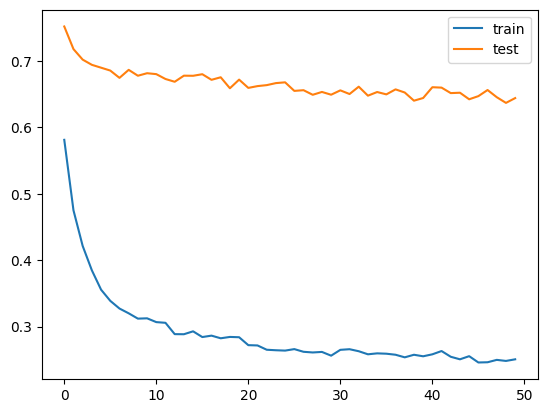

23/23 [==============================] - 1s 14ms/step


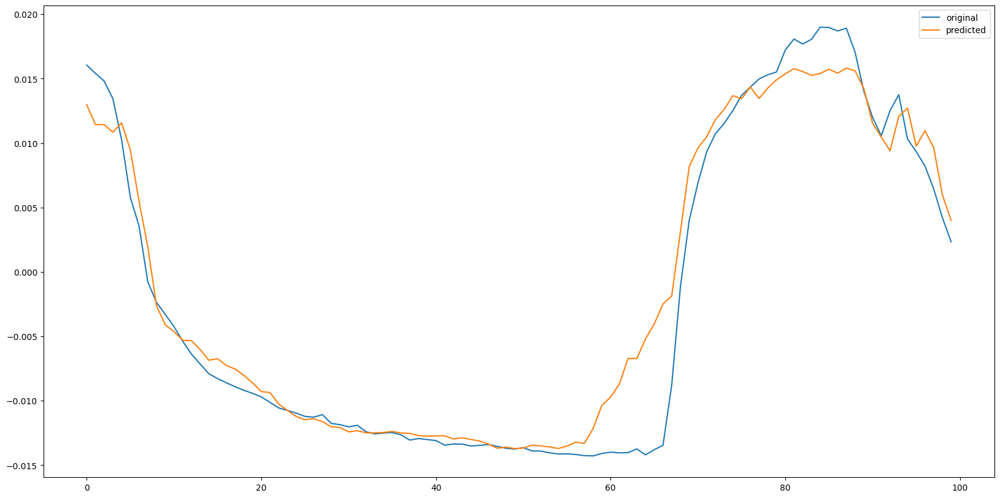

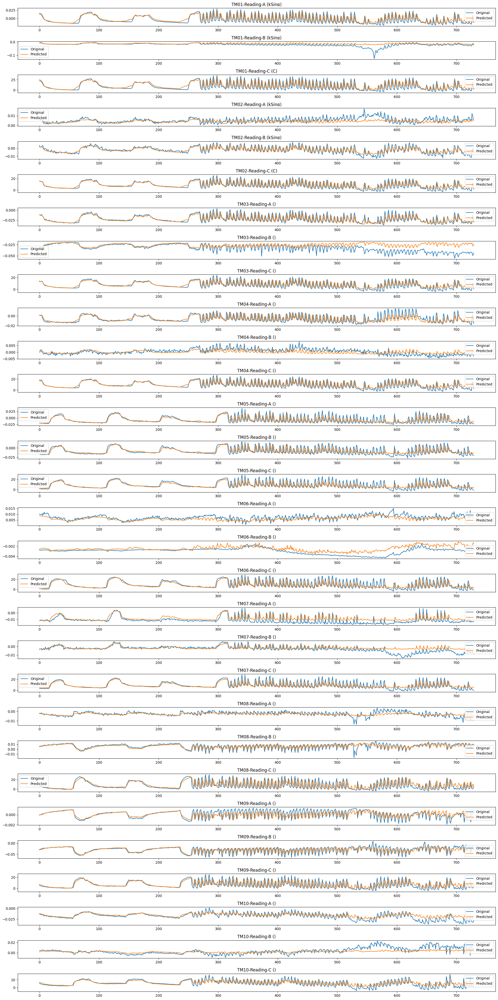

In [47]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

yhat = model.predict(test_X)

inv_yhat = scaler.inverse_transform(yhat)

inv_y = scaler.inverse_transform(test_y)

plt.figure(figsize=(20, 10))
plt.plot(inv_y[:100, 0], label="original")
plt.plot(inv_yhat[:100, 0], label="predicted")
plt.legend()
plt.show()

header_values = dataset.columns

def plot_predictions(original, predicted, header, num_columns=30):
    plt.figure(figsize=(20, 40))
    for i in range(num_columns):
        plt.subplot(num_columns, 1, i + 1)
        plt.plot(original[:, i], label='Original')
        plt.plot(predicted[:, i], label='Predicted')
        plt.title(header[i])
        plt.legend()
    plt.tight_layout()
    plt.show()

plot_predictions(inv_y, inv_yhat, header_values ,num_columns=n_features)


# Prophet (Tiltmeter)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/6kr9th28.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/w9x492cs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70396', 'data', 'file=/tmp/tmpjhgkojvn/6kr9th28.json', 'init=/tmp/tmpjhgkojvn/w9x492cs.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model2wdik3cb/prophet_model-20240721182022.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


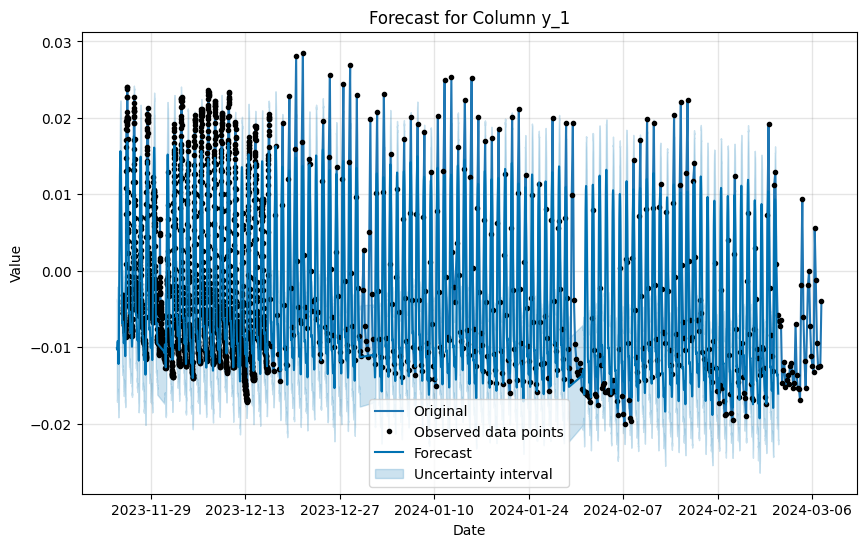

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/_nge85x8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/3mxzdw9h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62686', 'data', 'file=/tmp/tmpjhgkojvn/_nge85x8.json', 'init=/tmp/tmpjhgkojvn/3mxzdw9h.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelf93o_ojy/prophet_model-20240721182025.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


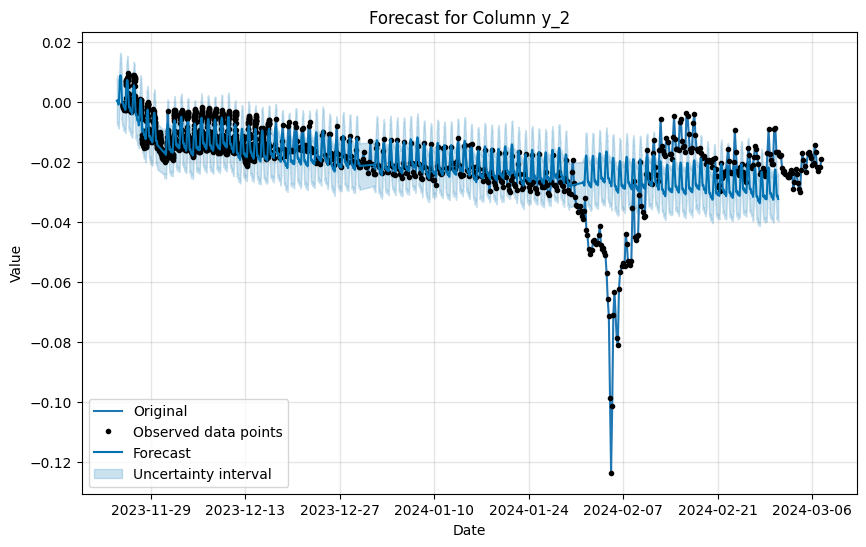

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/lbtsml6s.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/3nofrdy7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88245', 'data', 'file=/tmp/tmpjhgkojvn/lbtsml6s.json', 'init=/tmp/tmpjhgkojvn/3nofrdy7.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelkh4ydqtx/prophet_model-20240721182028.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


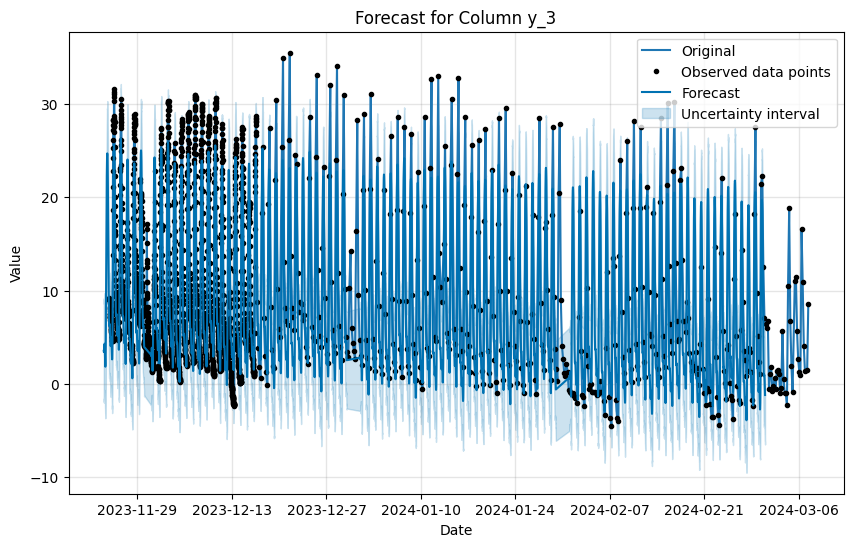

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/6yf8jog3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/b3lq6sxi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34026', 'data', 'file=/tmp/tmpjhgkojvn/6yf8jog3.json', 'init=/tmp/tmpjhgkojvn/b3lq6sxi.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modeln9p72dtv/prophet_model-20240721182030.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


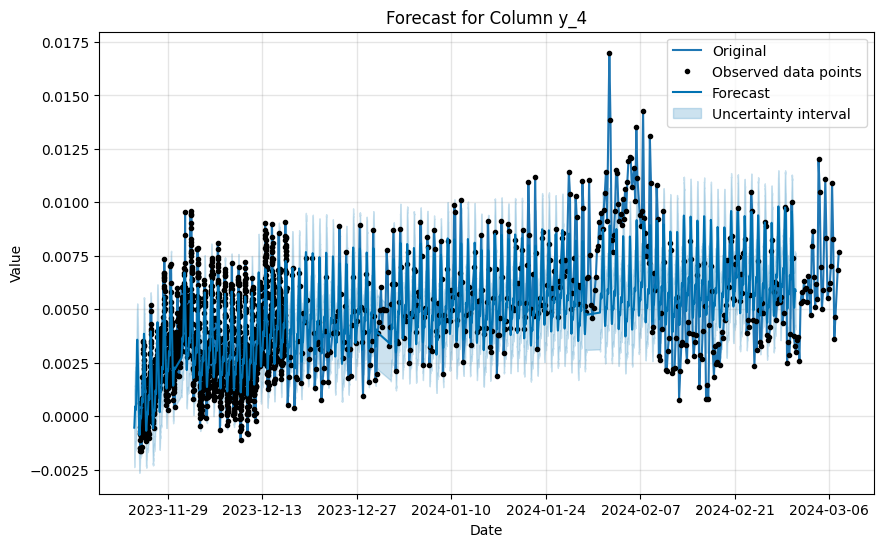

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/rfuuf2jd.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/wgcrkrdr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82895', 'data', 'file=/tmp/tmpjhgkojvn/rfuuf2jd.json', 'init=/tmp/tmpjhgkojvn/wgcrkrdr.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelrgnlm7y9/prophet_model-20240721182033.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


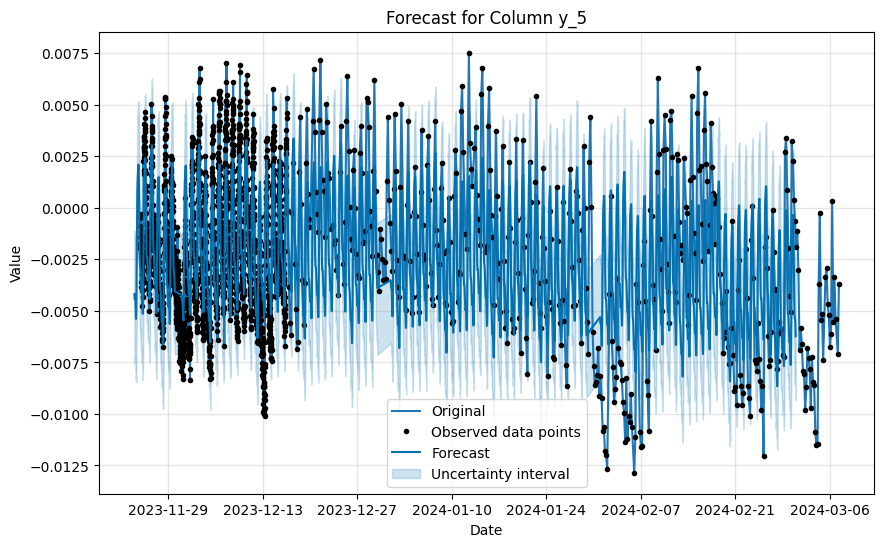

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/p0wllbdo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/m6lu07vj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22344', 'data', 'file=/tmp/tmpjhgkojvn/p0wllbdo.json', 'init=/tmp/tmpjhgkojvn/m6lu07vj.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelbo_52kc2/prophet_model-20240721182035.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


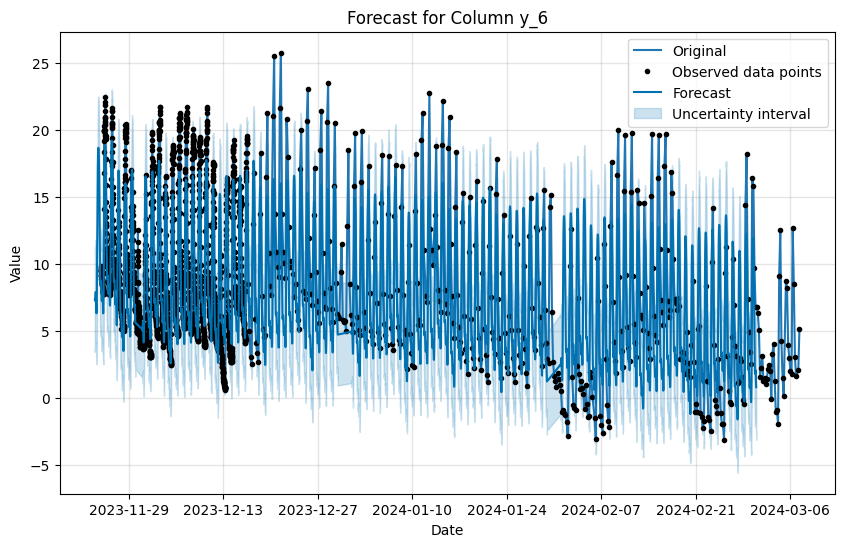

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/ylv7myh8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/fk7hxf1t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77430', 'data', 'file=/tmp/tmpjhgkojvn/ylv7myh8.json', 'init=/tmp/tmpjhgkojvn/fk7hxf1t.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model2phxutk9/prophet_model-20240721182038.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


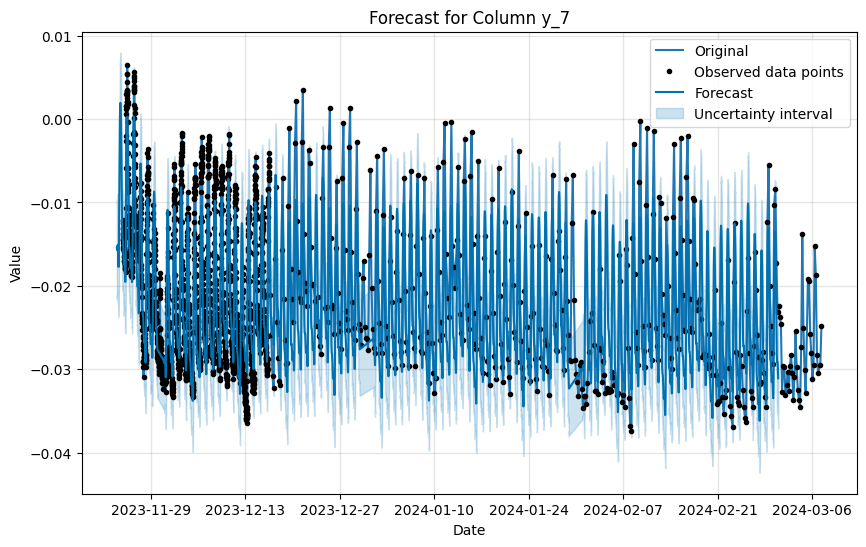

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/dyzlp7va.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/qvm0oln0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6742', 'data', 'file=/tmp/tmpjhgkojvn/dyzlp7va.json', 'init=/tmp/tmpjhgkojvn/qvm0oln0.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelnia7lhto/prophet_model-20240721182042.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


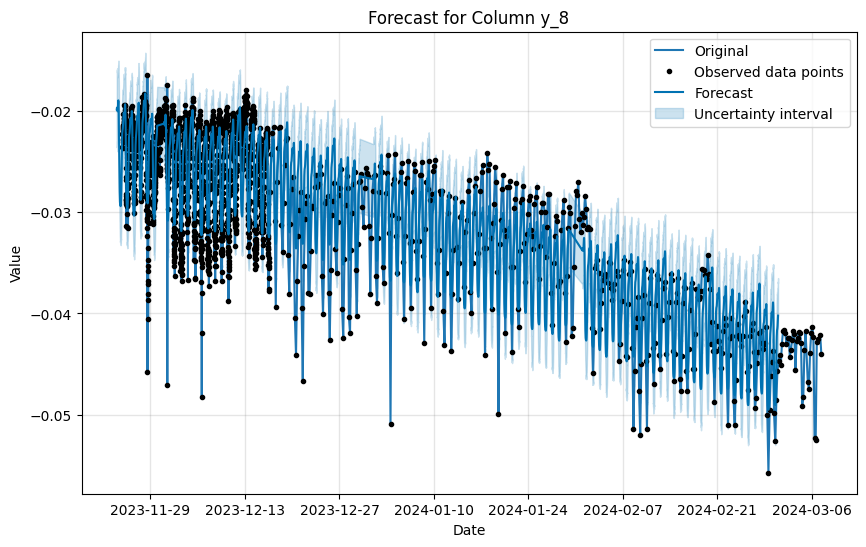

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/7gs4fa7h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/bb7tp00e.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21288', 'data', 'file=/tmp/tmpjhgkojvn/7gs4fa7h.json', 'init=/tmp/tmpjhgkojvn/bb7tp00e.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelpng9rv8j/prophet_model-20240721182044.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


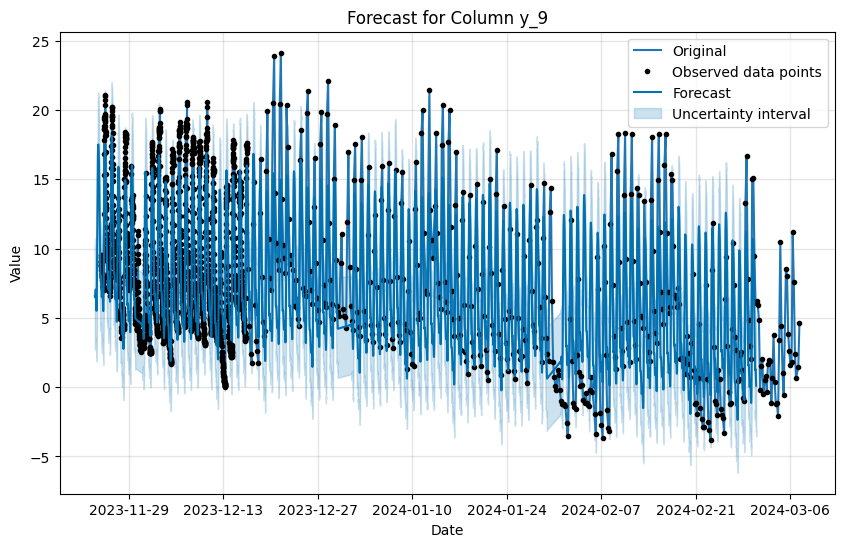

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/h0gx3tj3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/ejptj41j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67284', 'data', 'file=/tmp/tmpjhgkojvn/h0gx3tj3.json', 'init=/tmp/tmpjhgkojvn/ejptj41j.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model0thaagre/prophet_model-20240721182047.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


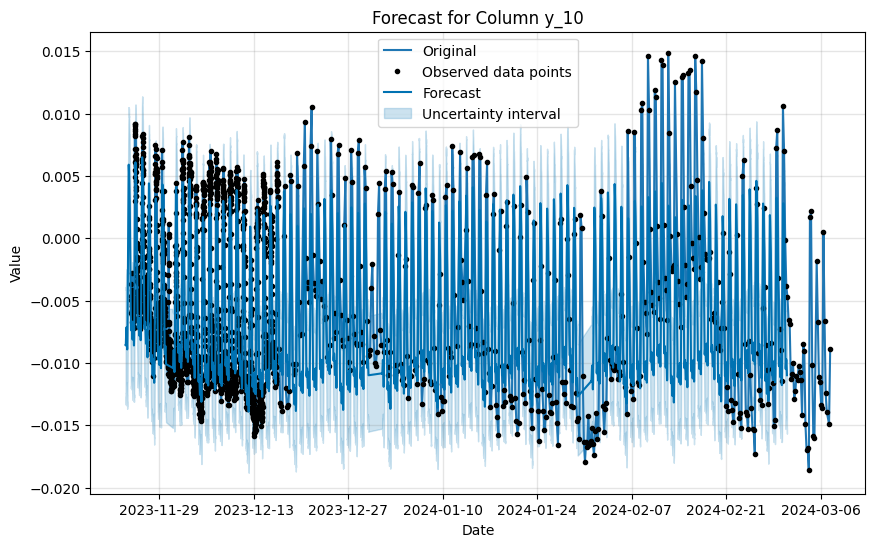

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/tmqtz19q.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/qfu9dvce.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23924', 'data', 'file=/tmp/tmpjhgkojvn/tmqtz19q.json', 'init=/tmp/tmpjhgkojvn/qfu9dvce.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model6ge5hdeh/prophet_model-20240721182050.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


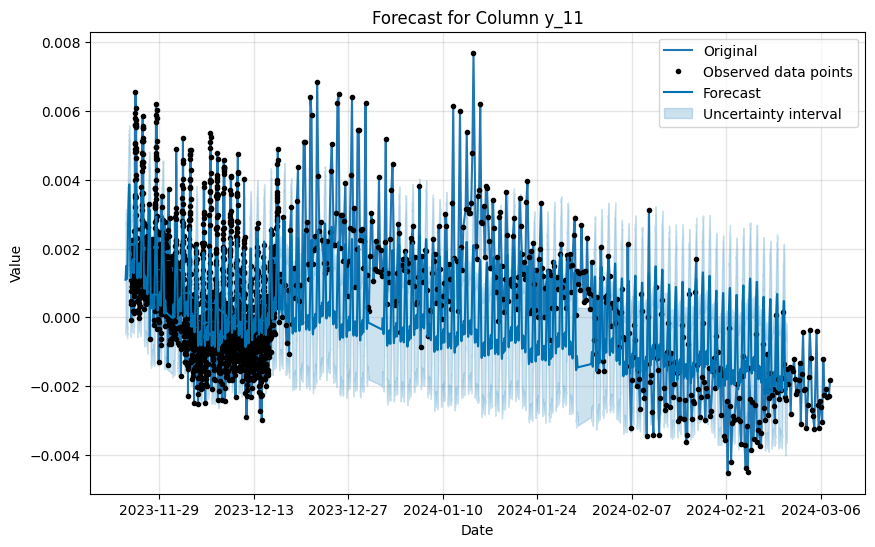

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/cmb7h2op.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/wt8tq742.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64799', 'data', 'file=/tmp/tmpjhgkojvn/cmb7h2op.json', 'init=/tmp/tmpjhgkojvn/wt8tq742.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modeln7fm6jb8/prophet_model-20240721182053.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


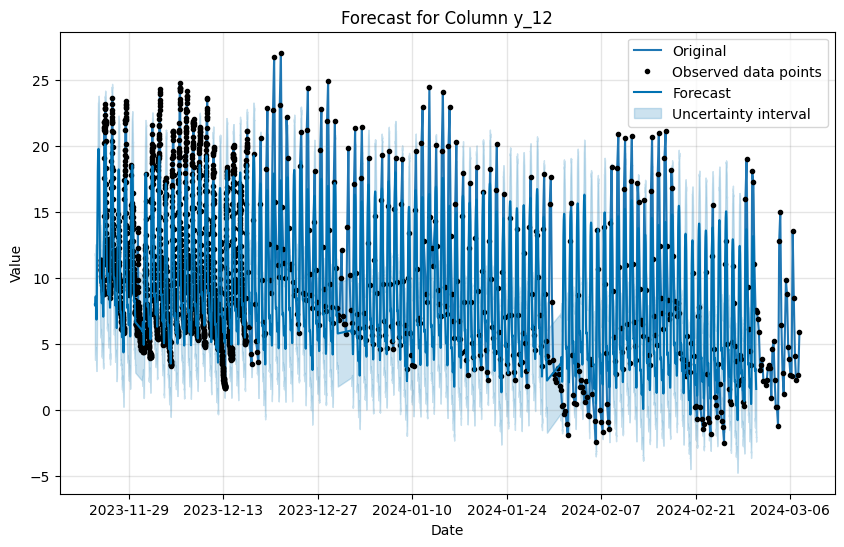

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/5tznas25.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/k1phs8dc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57812', 'data', 'file=/tmp/tmpjhgkojvn/5tznas25.json', 'init=/tmp/tmpjhgkojvn/k1phs8dc.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model2rv60xvf/prophet_model-20240721182056.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


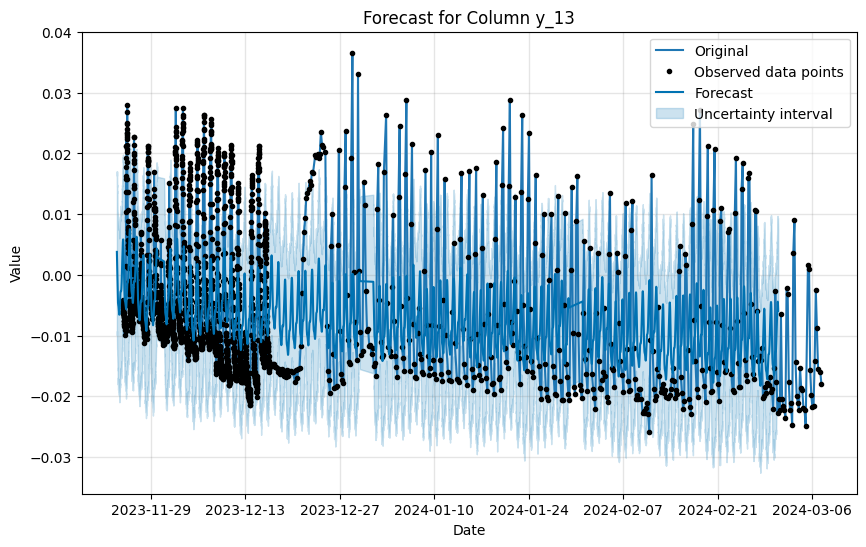

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/1sjo76cw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/8bob4imf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97877', 'data', 'file=/tmp/tmpjhgkojvn/1sjo76cw.json', 'init=/tmp/tmpjhgkojvn/8bob4imf.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model9l_ec1fc/prophet_model-20240721182058.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:20:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:20:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


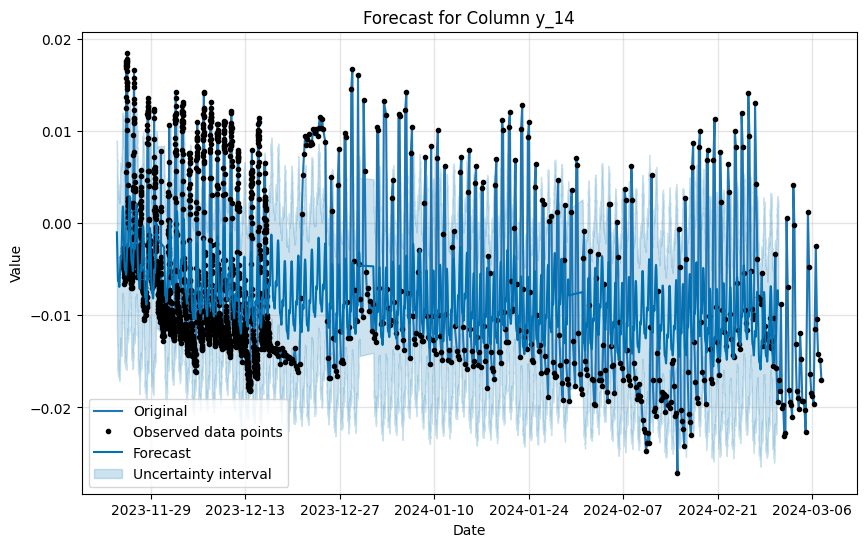

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/d6epgo4m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/e3i2ui56.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57804', 'data', 'file=/tmp/tmpjhgkojvn/d6epgo4m.json', 'init=/tmp/tmpjhgkojvn/e3i2ui56.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model7wses81o/prophet_model-20240721182101.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


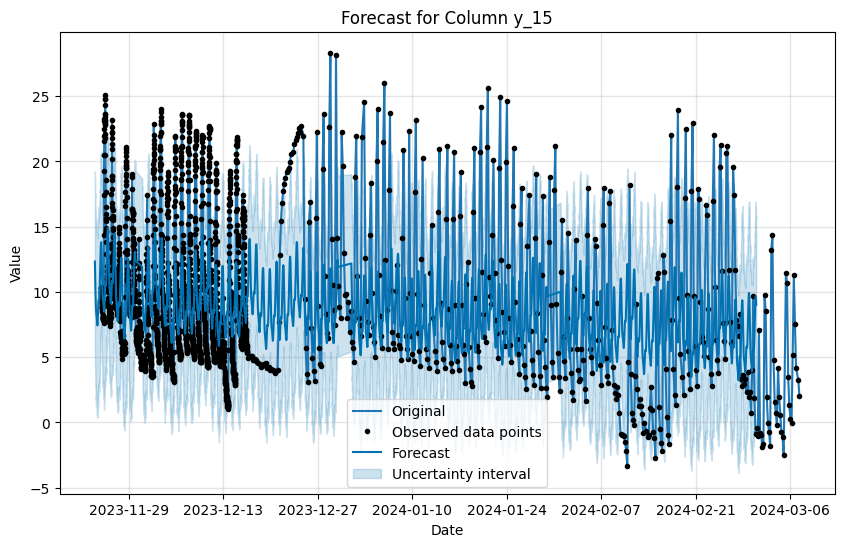

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/s8qcfxpw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/6ilzy_e4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69409', 'data', 'file=/tmp/tmpjhgkojvn/s8qcfxpw.json', 'init=/tmp/tmpjhgkojvn/6ilzy_e4.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelqss40hxo/prophet_model-20240721182103.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


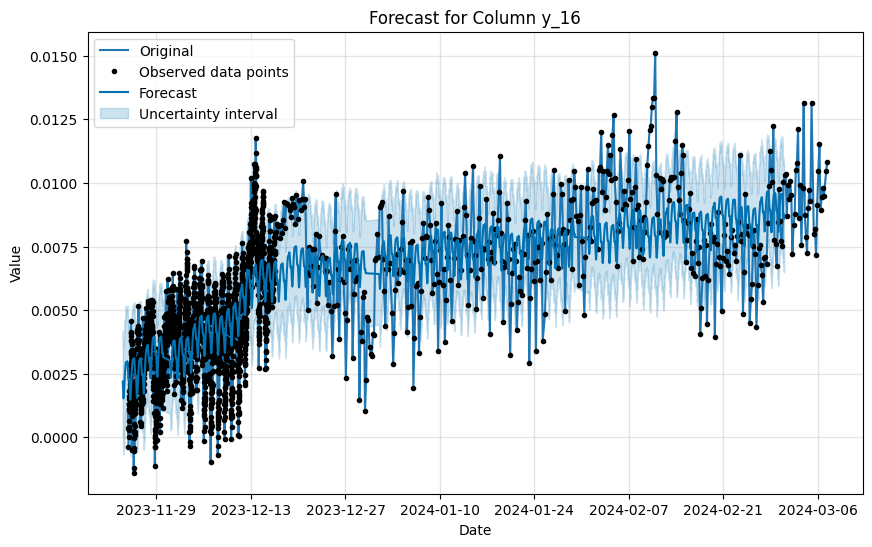

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/uauzg7ko.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/1loggiw8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60728', 'data', 'file=/tmp/tmpjhgkojvn/uauzg7ko.json', 'init=/tmp/tmpjhgkojvn/1loggiw8.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model3k655sjt/prophet_model-20240721182107.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


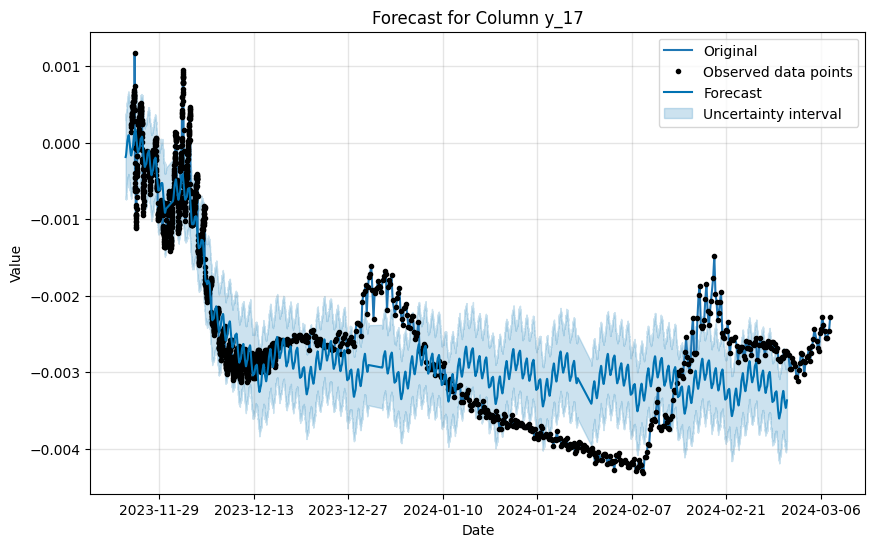

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/ki0gw6fp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/5yq2akf0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12611', 'data', 'file=/tmp/tmpjhgkojvn/ki0gw6fp.json', 'init=/tmp/tmpjhgkojvn/5yq2akf0.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelh1vr9qt3/prophet_model-20240721182110.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


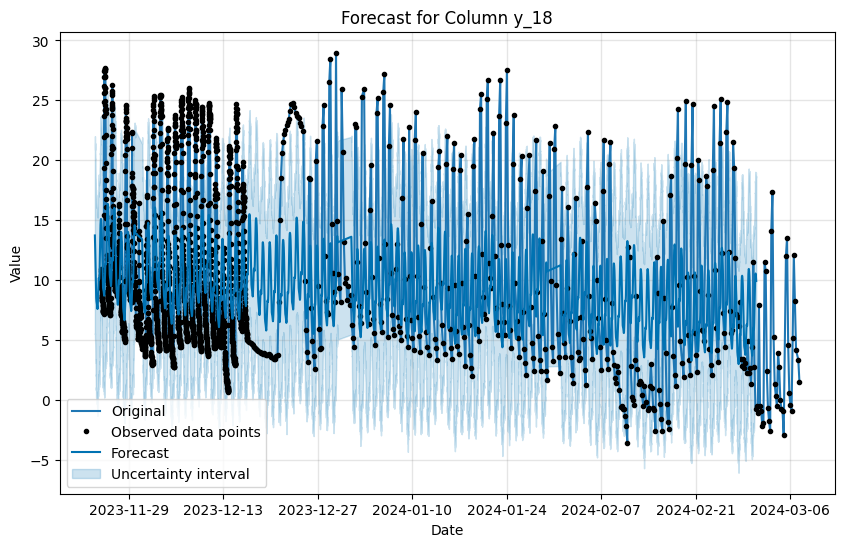

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/5qo9wpps.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/f2ds8e3g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=74489', 'data', 'file=/tmp/tmpjhgkojvn/5qo9wpps.json', 'init=/tmp/tmpjhgkojvn/f2ds8e3g.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelkhnqkn2_/prophet_model-20240721182113.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


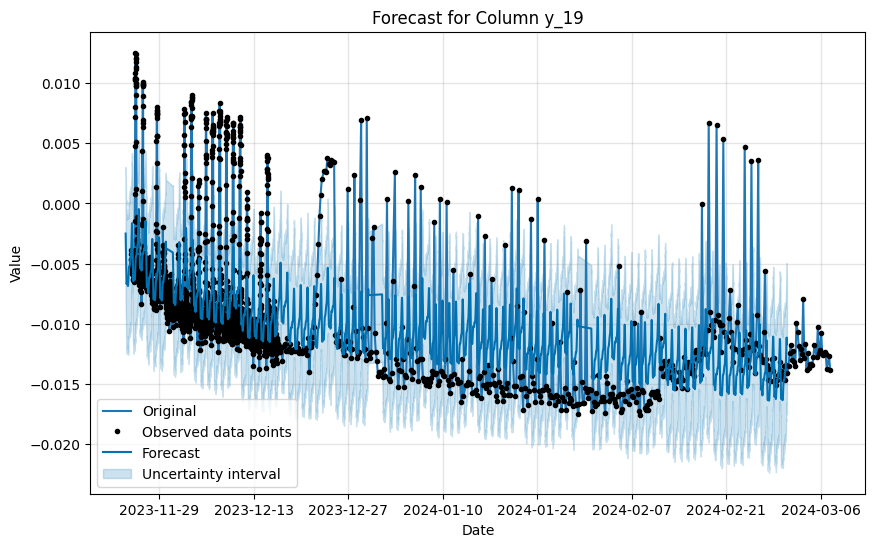

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/du3jgauv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/1jpbvbud.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53925', 'data', 'file=/tmp/tmpjhgkojvn/du3jgauv.json', 'init=/tmp/tmpjhgkojvn/1jpbvbud.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modeltg1pza5a/prophet_model-20240721182115.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


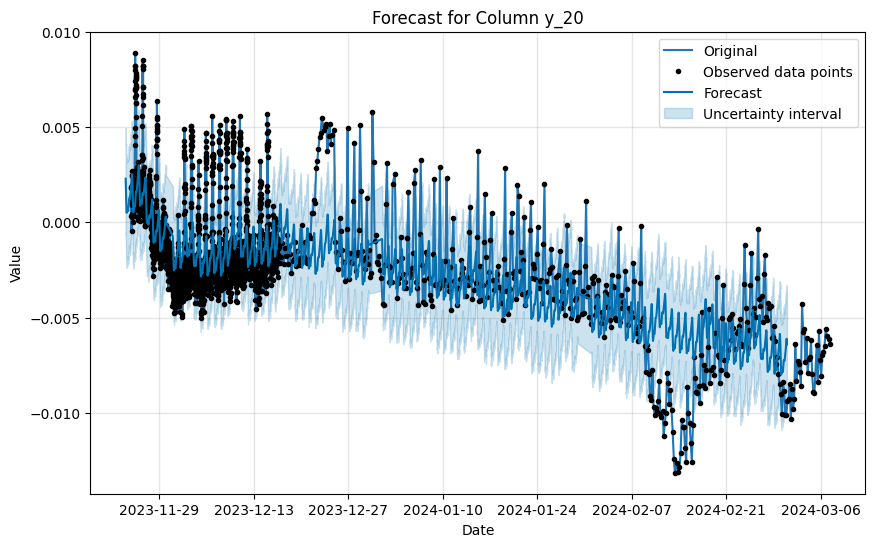

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/k4y4z7hv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/doorsq53.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67078', 'data', 'file=/tmp/tmpjhgkojvn/k4y4z7hv.json', 'init=/tmp/tmpjhgkojvn/doorsq53.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelokm5e0xh/prophet_model-20240721182118.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


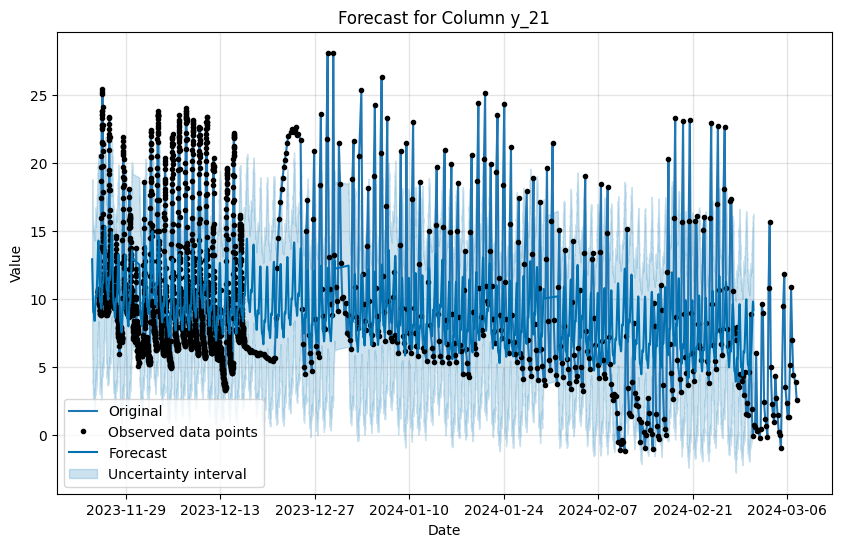

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/jpiab3zv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/v__s1pdw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12191', 'data', 'file=/tmp/tmpjhgkojvn/jpiab3zv.json', 'init=/tmp/tmpjhgkojvn/v__s1pdw.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model43lgn0gl/prophet_model-20240721182121.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


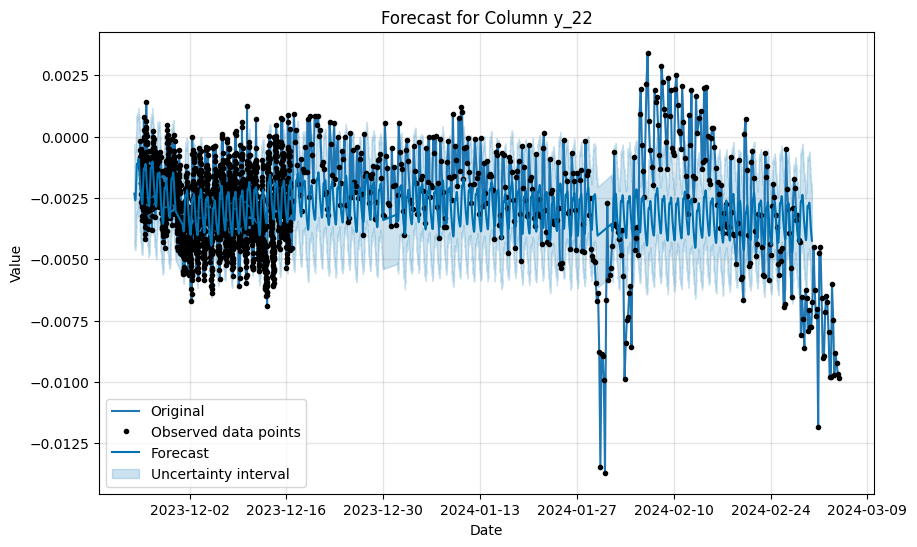

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/ph2gpq3f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/8ic75fft.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8290', 'data', 'file=/tmp/tmpjhgkojvn/ph2gpq3f.json', 'init=/tmp/tmpjhgkojvn/8ic75fft.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelfe0tealt/prophet_model-20240721182125.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


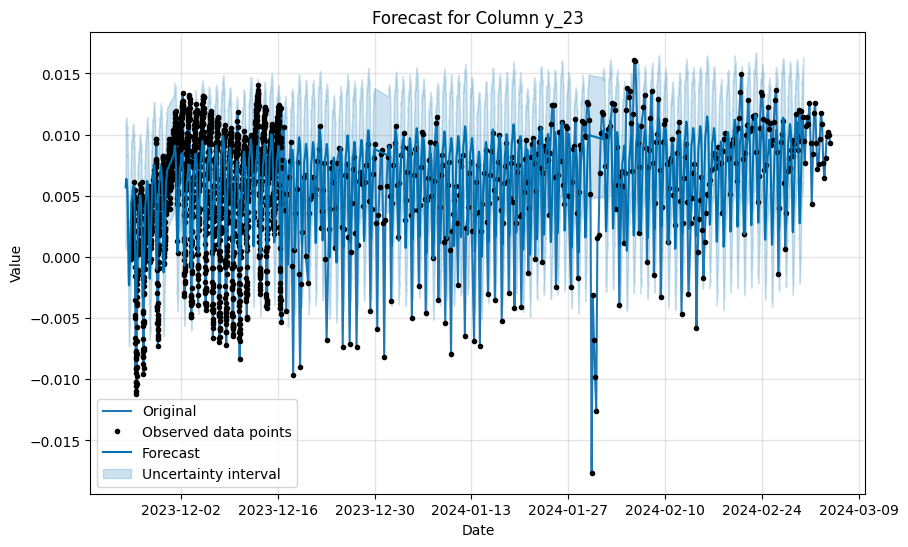

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/pywhsipk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/x24yc6r7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13816', 'data', 'file=/tmp/tmpjhgkojvn/pywhsipk.json', 'init=/tmp/tmpjhgkojvn/x24yc6r7.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modela2jv_3gu/prophet_model-20240721182128.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


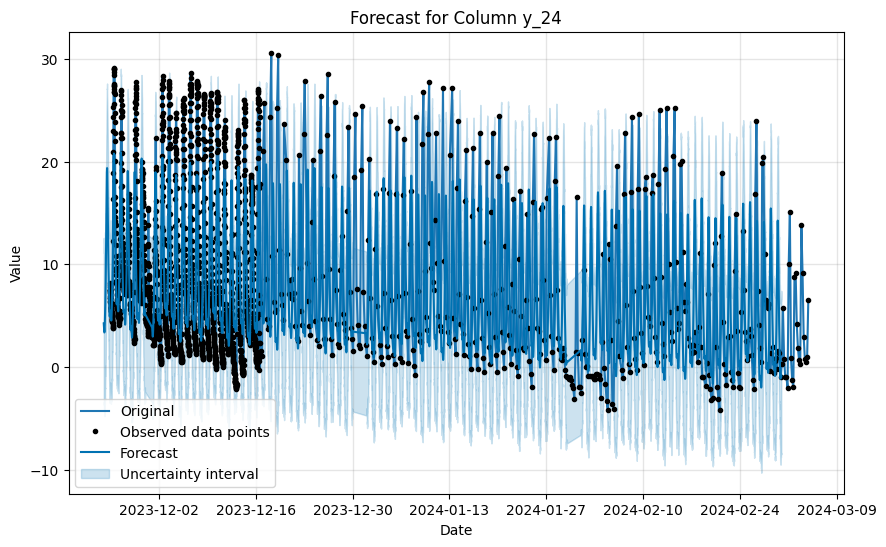

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/tr6c_n4r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/_9okn6_6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54582', 'data', 'file=/tmp/tmpjhgkojvn/tr6c_n4r.json', 'init=/tmp/tmpjhgkojvn/_9okn6_6.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelvlaa9u_3/prophet_model-20240721182131.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


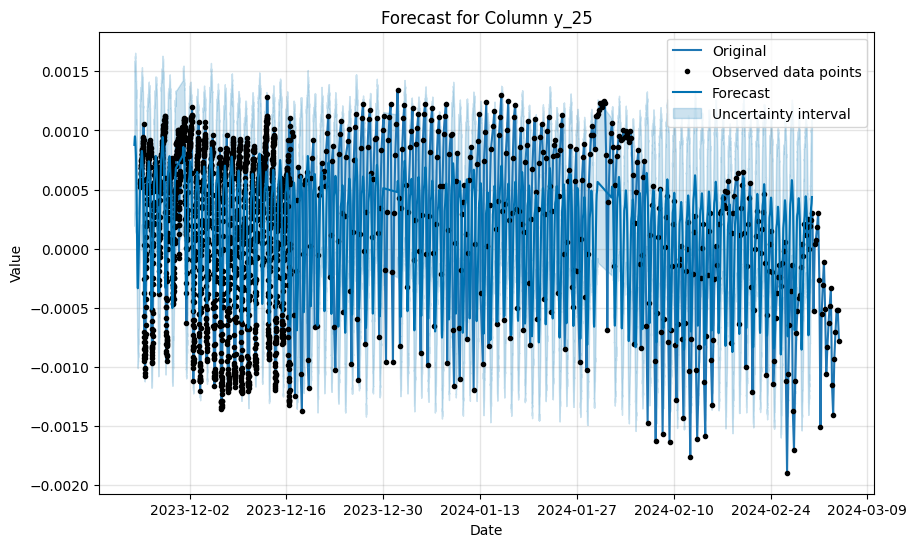

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/cgfj9vbs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/2oxybm_b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93061', 'data', 'file=/tmp/tmpjhgkojvn/cgfj9vbs.json', 'init=/tmp/tmpjhgkojvn/2oxybm_b.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelo3xwvdg5/prophet_model-20240721182134.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


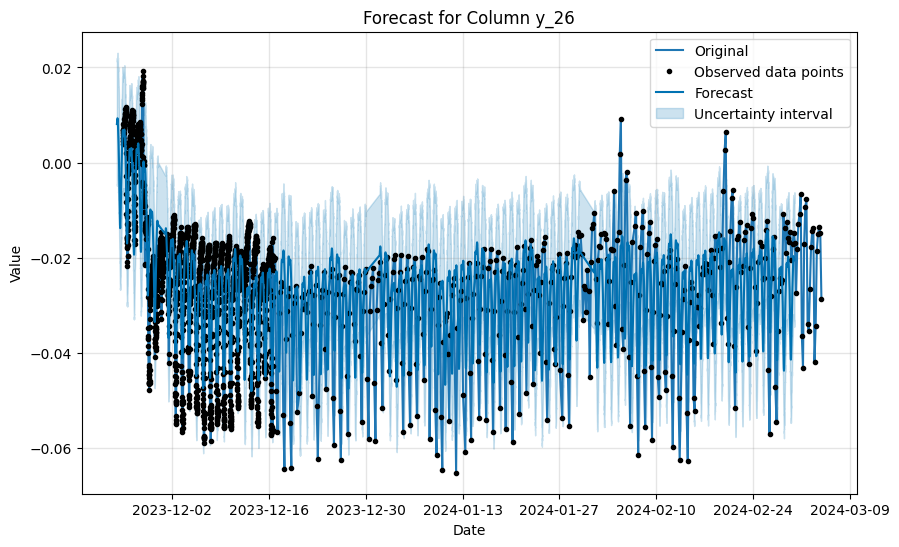

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/5yumsnyf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/ca7scntk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2122', 'data', 'file=/tmp/tmpjhgkojvn/5yumsnyf.json', 'init=/tmp/tmpjhgkojvn/ca7scntk.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model4jq9ugt5/prophet_model-20240721182138.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


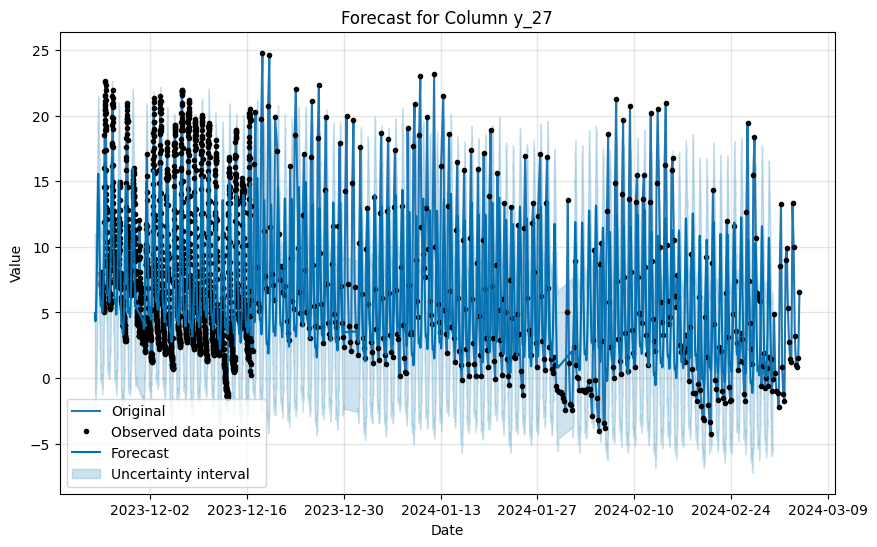

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/b65awp13.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/rtiw87nk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92665', 'data', 'file=/tmp/tmpjhgkojvn/b65awp13.json', 'init=/tmp/tmpjhgkojvn/rtiw87nk.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model3eph1sks/prophet_model-20240721182140.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


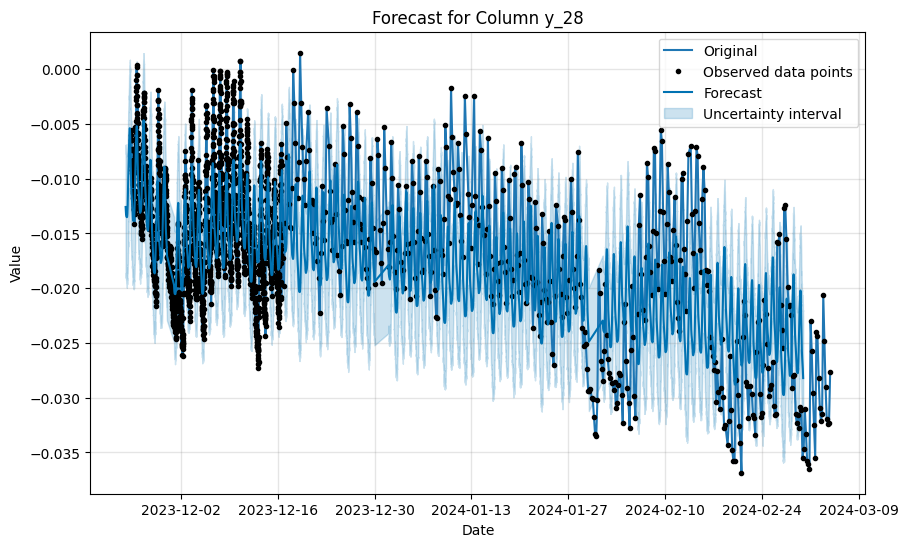

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/wpjuclbp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/k3zcxcxu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91060', 'data', 'file=/tmp/tmpjhgkojvn/wpjuclbp.json', 'init=/tmp/tmpjhgkojvn/k3zcxcxu.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model7mh41uzd/prophet_model-20240721182143.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:21:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:21:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


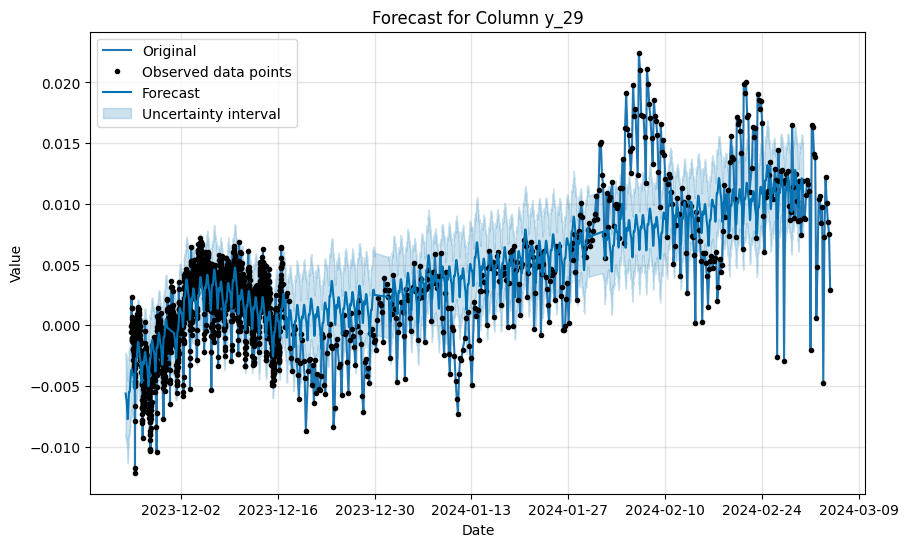

In [48]:
import pandas as pd
from pandas import to_datetime, DataFrame
from prophet import Prophet
from matplotlib import pyplot as plt

path = '/content/TM_combine_data.xlsx'
df = pd.read_excel(path, header=0)

columns_to_process = [df.columns[i:i+30] for i in range(0, len(df.columns), 30)]

# Preparing columns for prediction
future = []
for year in range(2023, 2024):
    for month in range(11, 12):
        for day in range(24, 30):
            for hour in range(0, 24):
                for minute in range(0, 60, 15):
                    date = f'{day:02d}-{month:02d}-{year:04d} {hour:02d}:{minute:02d}'
                    future.append([date])
for year in range(2023, 2024):
    for month in range(12, 13):
        for day in range(1, 30):
            for hour in range(0, 24):
                for minute in range(0, 60, 15):
                    date = f'{day:02d}-{month:02d}-{year:04d} {hour:02d}:{minute:02d}'
                    future.append([date])
for year in range(2024, 2025):
    for month in range(1, 3):
        for day in range(1, 30):
            for hour in range(0, 24):
                for minute in range(0, 60, 15):
                    date = f'{day:02d}-{month:02d}-{year:04d} {hour:02d}:{minute:02d}'
                    future.append([date])

future_df = DataFrame(future, columns=['ds'])
future_df['ds'] = to_datetime(future_df['ds'], format='%d-%m-%Y %H:%M')

# Iterating over each set of columns and apply the model
for i, columns in enumerate(columns_to_process):
    if 'Date Time (UTC+08:00)' in columns:
        columns_to_keep = ['Date Time (UTC+08:00)'] + list(columns[1:31])
        df_subset = df[columns_to_keep].copy()
        df_subset.columns = ['ds'] + [f'y_{i}' for i in range(1, len(columns_to_keep))]

        for j in range(1, len(df_subset.columns)):
            original_column_name = df_subset.columns[j]
            df_feature = df_subset[['ds', original_column_name]].copy()
            df_feature.columns = ['ds', 'y']
            df_feature['ds'] = to_datetime(df_feature['ds'], errors='coerce')
            df_feature = df_feature.dropna(subset=['ds'])

            # Checking if any NaN values in the 'ds' column
            if df_feature['ds'].isnull().any():
                print(f'Skipping column {original_column_name} due to NaN values in "ds" after conversion.')
                continue

            model = Prophet()
            model.fit(df_feature)

            forecast = model.predict(future_df)

            plt.figure(figsize=(10, 6))
            plt.plot(df_feature['ds'], df_feature['y'], label='Original')

            model.plot(forecast, ax=plt.gca(), xlabel='Date', ylabel='Value')

            plt.title(f'Forecast for Column {original_column_name}')
            plt.legend()
            plt.show()


#LSTM (Crackmeter)

Epoch 1/20
52/52 [==============================] - 4s 29ms/step - loss: 0.2440 - val_loss: 0.2898
Epoch 2/20
52/52 [==============================] - 1s 12ms/step - loss: 0.1639 - val_loss: 0.2544
Epoch 3/20
52/52 [==============================] - 1s 13ms/step - loss: 0.1452 - val_loss: 0.2402
Epoch 4/20
52/52 [==============================] - 1s 13ms/step - loss: 0.1340 - val_loss: 0.2322
Epoch 5/20
52/52 [==============================] - 1s 13ms/step - loss: 0.1264 - val_loss: 0.2250
Epoch 6/20
52/52 [==============================] - 1s 13ms/step - loss: 0.1223 - val_loss: 0.2200
Epoch 7/20
52/52 [==============================] - 1s 13ms/step - loss: 0.1186 - val_loss: 0.2161
Epoch 8/20
52/52 [==============================] - 1s 13ms/step - loss: 0.1159 - val_loss: 0.2138
Epoch 9/20
52/52 [==============================] - 1s 13ms/step - loss: 0.1141 - val_loss: 0.2106
Epoch 10/20
52/52 [==============================] - 1s 13ms/step - loss: 0.1121 - val_loss: 0.2097
Epoch 11/

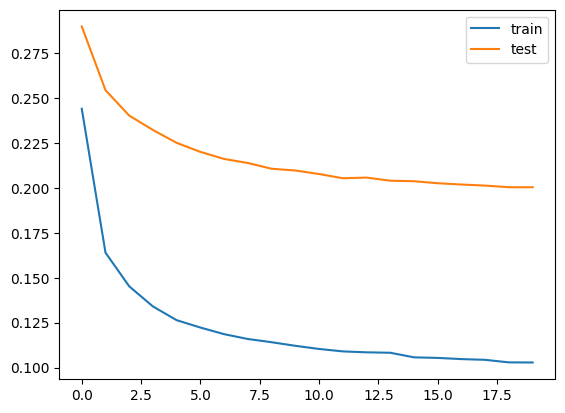

22/22 [==============================] - 0s 4ms/step


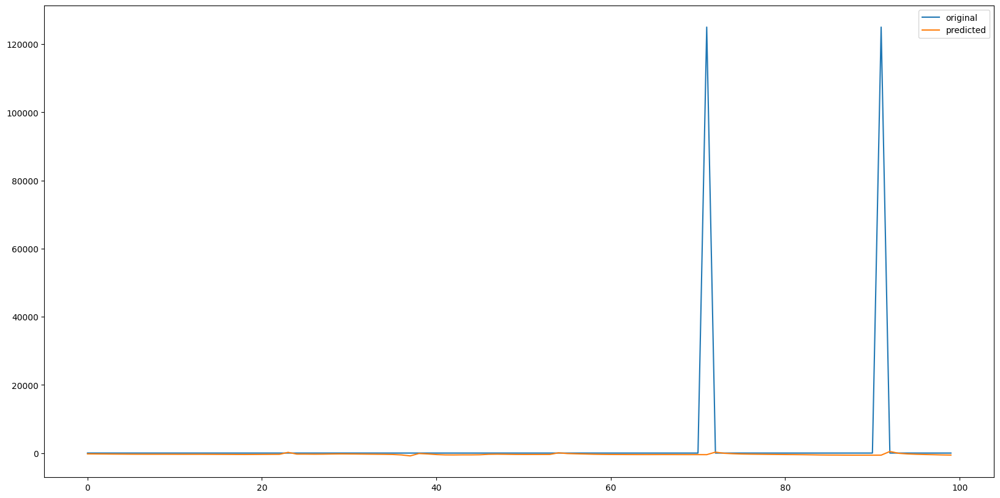

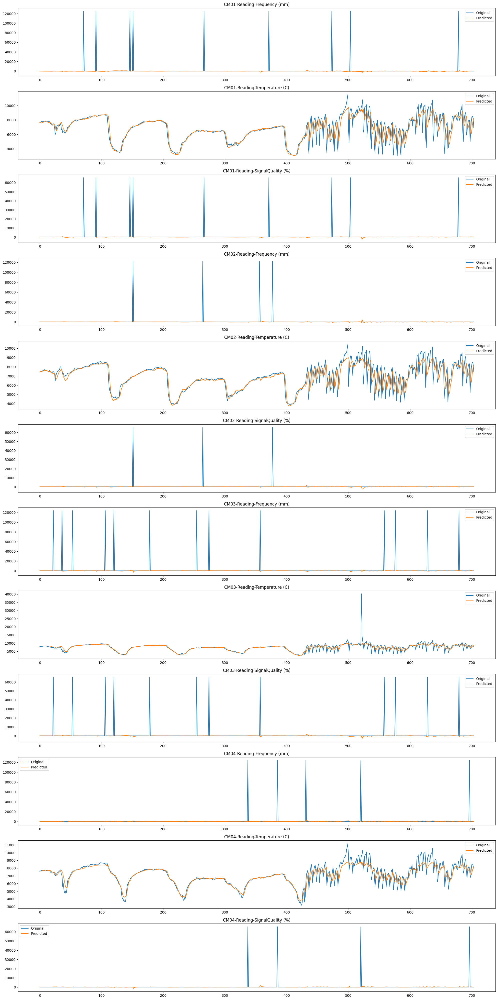

In [49]:
from math import sqrt
from numpy import concatenate
from matplotlib import pyplot
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from pandas import read_excel
from matplotlib import pyplot
from sklearn.preprocessing import StandardScaler

file_path = "/content/CM_Combine_Data.xlsx"
dataset = read_excel(file_path, header=0, index_col=0)
values = dataset.values

def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = DataFrame(data)
	cols, names = list(), list()
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]

	agg = concat(cols, axis=1)
	agg.columns = names

	if dropnan:
		agg.dropna(inplace=True)
	return agg


scaler = StandardScaler()
scaled = scaler.fit_transform(values)
n_previous = 20
n_features = 12
reframed = series_to_supervised(scaled, n_previous, 1)
values = reframed.values


split_ratio = 0.7
n_train_samples = int(len(values) * split_ratio)


train = values[:n_train_samples, :]
test = values[n_train_samples:, :]
n_obs = n_previous*n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features:]
test_X, test_y = test[:, :n_obs], test[:, -n_features:]

train_X = train_X.reshape((train_X.shape[0], n_previous, n_features))
test_X = test_X.reshape((test_X.shape[0], n_previous, n_features))



model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(n_features))
model.compile(loss='mae', optimizer='adam')

history = model.fit(train_X, train_y, epochs=20, validation_data=(test_X, test_y), verbose=1, shuffle=False)

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()


# Make a prediction
yhat = model.predict(test_X)
import matplotlib.pyplot as plt
# Invert scaling for forecast
inv_yhat = scaler.inverse_transform(yhat)

# Invert scaling for actual
inv_y = scaler.inverse_transform(test_y)

# Plot the results
plt.figure(figsize=(20, 10))
plt.plot(inv_y[:100, 0], label="original")
plt.plot(inv_yhat[:100, 0], label="predicted")
plt.legend()
plt.show()

header_values = dataset.columns

# Function to plot predictions for all columns
def plot_predictions(original, predicted, header, num_columns=12):
    plt.figure(figsize=(20, 40))
    for i in range(num_columns):
        plt.subplot(num_columns, 1, i + 1)
        plt.plot(original[:, i], label='Original')
        plt.plot(predicted[:, i], label='Predicted')
        plt.title(header_values[i])
        plt.legend()
    plt.tight_layout()
    plt.show()

# Plot predictions for all columns
plot_predictions(inv_y, inv_yhat, header_values, num_columns=n_features)


#Prophet(Crackmeter)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/al9e6lg6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/1plui80t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=37972', 'data', 'file=/tmp/tmpjhgkojvn/al9e6lg6.json', 'init=/tmp/tmpjhgkojvn/1plui80t.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model1ipty__3/prophet_model-20240721182217.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:22:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:22:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


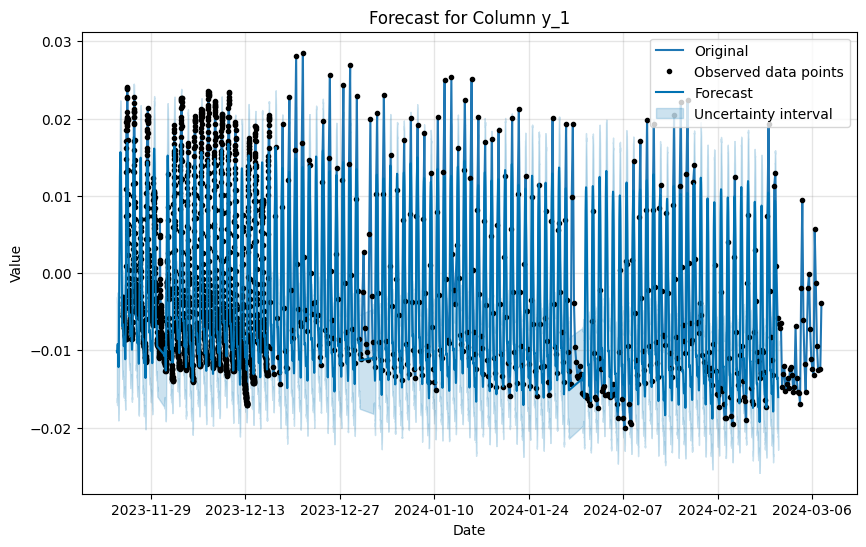

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/e6knzb6j.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/h0wx4ds8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93708', 'data', 'file=/tmp/tmpjhgkojvn/e6knzb6j.json', 'init=/tmp/tmpjhgkojvn/h0wx4ds8.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelsq8zia4w/prophet_model-20240721182220.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:22:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:22:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


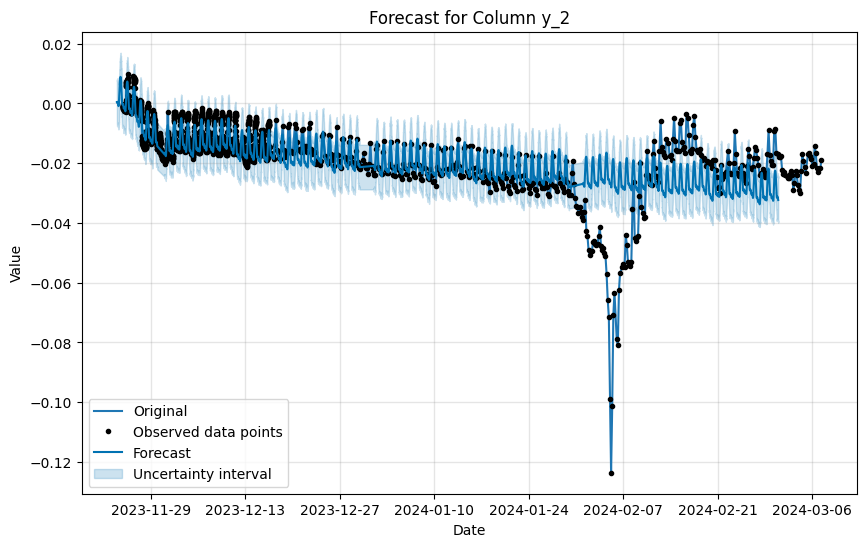

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/_rcu8bbh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/nyi3oy3t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91601', 'data', 'file=/tmp/tmpjhgkojvn/_rcu8bbh.json', 'init=/tmp/tmpjhgkojvn/nyi3oy3t.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelj2grt1tr/prophet_model-20240721182222.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:22:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:22:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


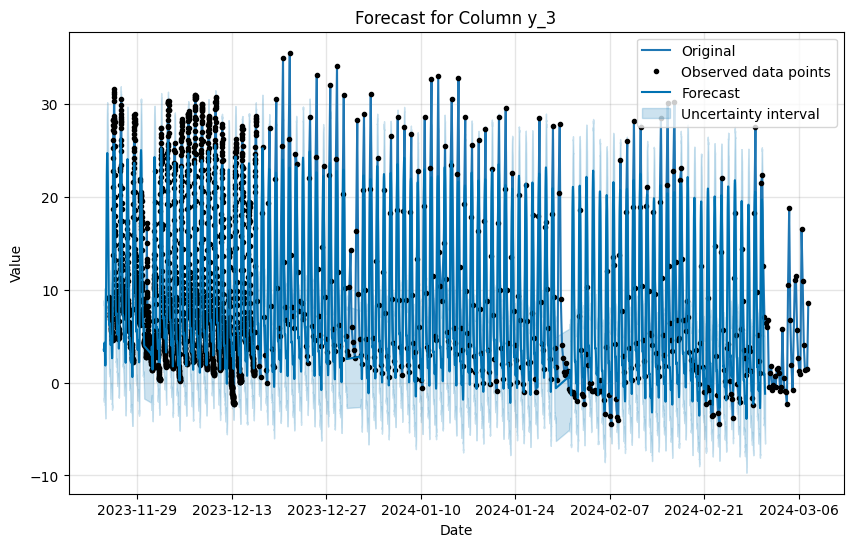

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/n4v7ayb5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/lisjp3rd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16124', 'data', 'file=/tmp/tmpjhgkojvn/n4v7ayb5.json', 'init=/tmp/tmpjhgkojvn/lisjp3rd.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelqay61x3x/prophet_model-20240721182225.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:22:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:22:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


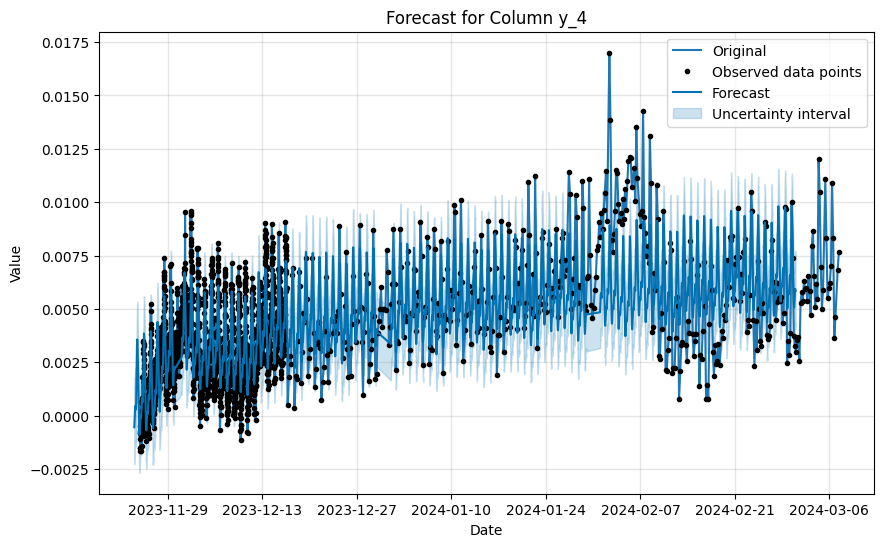

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/1hz395kg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/bbvdifkk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16023', 'data', 'file=/tmp/tmpjhgkojvn/1hz395kg.json', 'init=/tmp/tmpjhgkojvn/bbvdifkk.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model9t3i8o60/prophet_model-20240721182228.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:22:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:22:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


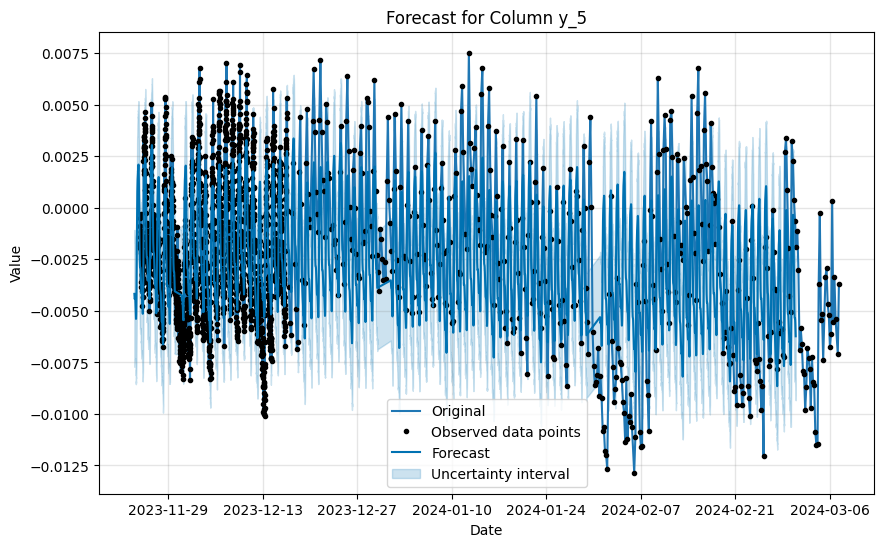

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/5ipa5luf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/v8pgqcx5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21132', 'data', 'file=/tmp/tmpjhgkojvn/5ipa5luf.json', 'init=/tmp/tmpjhgkojvn/v8pgqcx5.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelj8f50_0e/prophet_model-20240721182231.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:22:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:22:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


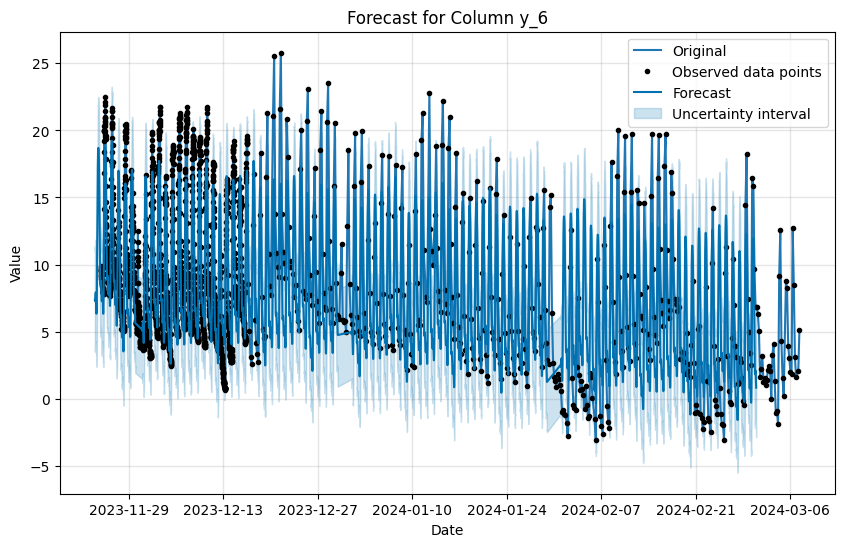

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/tj8c26js.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/583os1g_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49882', 'data', 'file=/tmp/tmpjhgkojvn/tj8c26js.json', 'init=/tmp/tmpjhgkojvn/583os1g_.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelkzsfuejv/prophet_model-20240721182234.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:22:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:22:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


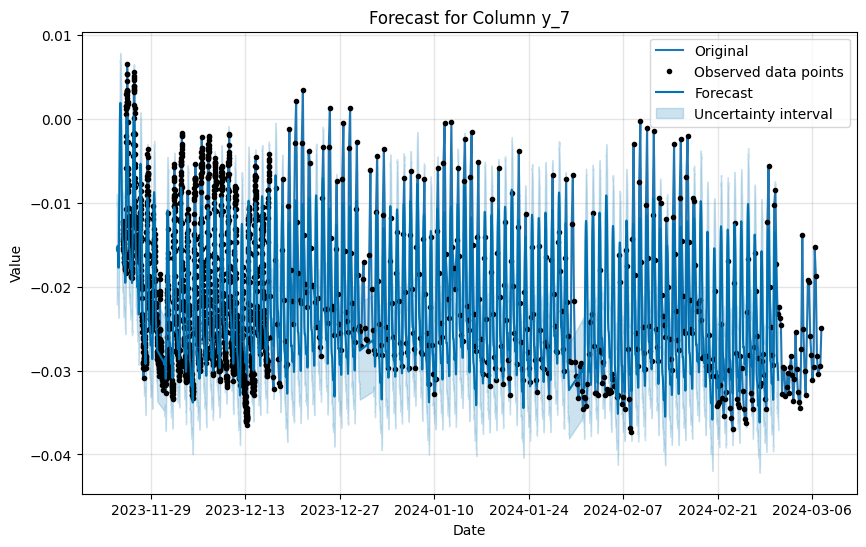

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/w6svp03m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/t_bgodn1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80802', 'data', 'file=/tmp/tmpjhgkojvn/w6svp03m.json', 'init=/tmp/tmpjhgkojvn/t_bgodn1.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelnpl5n1m9/prophet_model-20240721182236.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:22:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:22:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


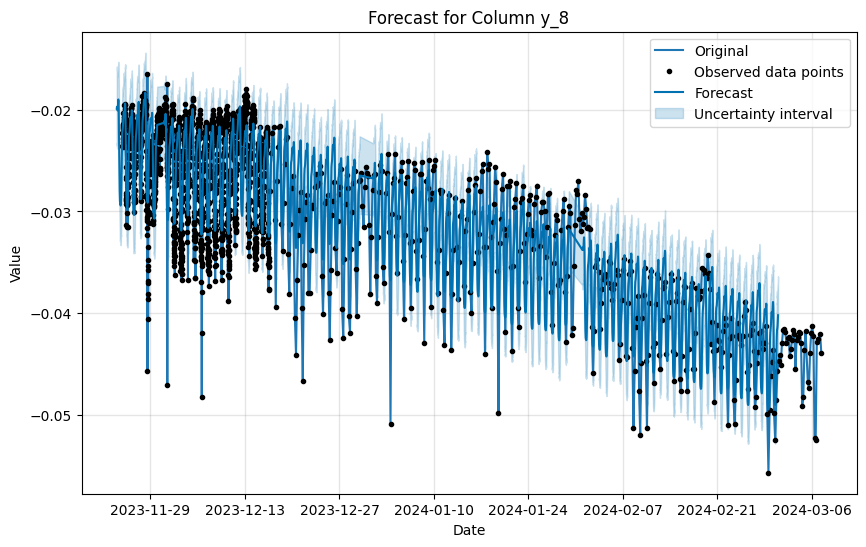

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/pdig3h6b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/qbuz88_t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=24307', 'data', 'file=/tmp/tmpjhgkojvn/pdig3h6b.json', 'init=/tmp/tmpjhgkojvn/qbuz88_t.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model55nk07ws/prophet_model-20240721182239.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:22:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:22:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


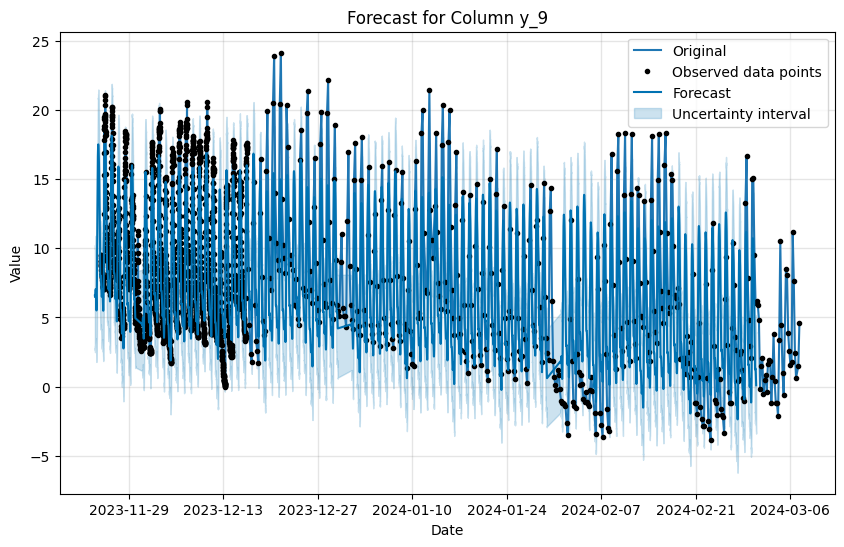

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/xq2_tdr9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/8_njymuk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23774', 'data', 'file=/tmp/tmpjhgkojvn/xq2_tdr9.json', 'init=/tmp/tmpjhgkojvn/8_njymuk.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_model13xj2qsf/prophet_model-20240721182241.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:22:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:22:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


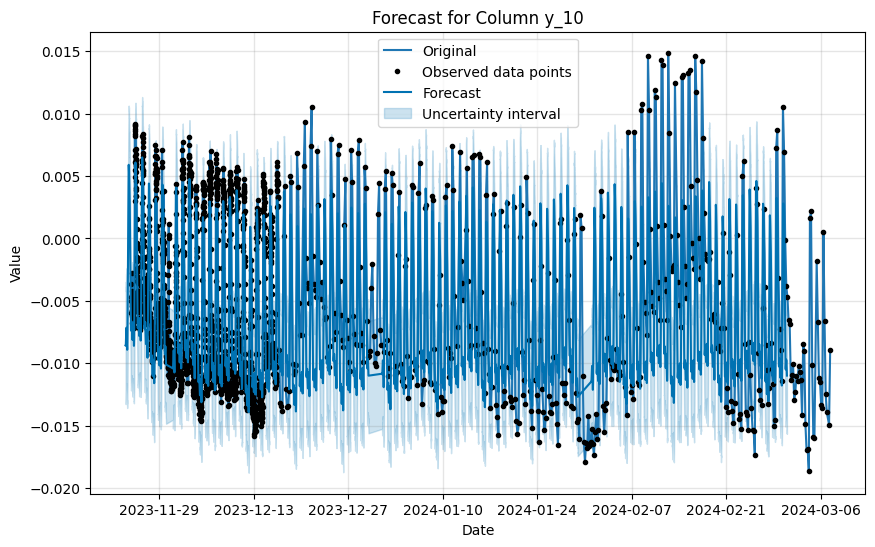

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/g2bcv3ha.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpjhgkojvn/yqesoiah.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88557', 'data', 'file=/tmp/tmpjhgkojvn/g2bcv3ha.json', 'init=/tmp/tmpjhgkojvn/yqesoiah.json', 'output', 'file=/tmp/tmpjhgkojvn/prophet_modelcyc62d_j/prophet_model-20240721182244.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:22:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:22:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


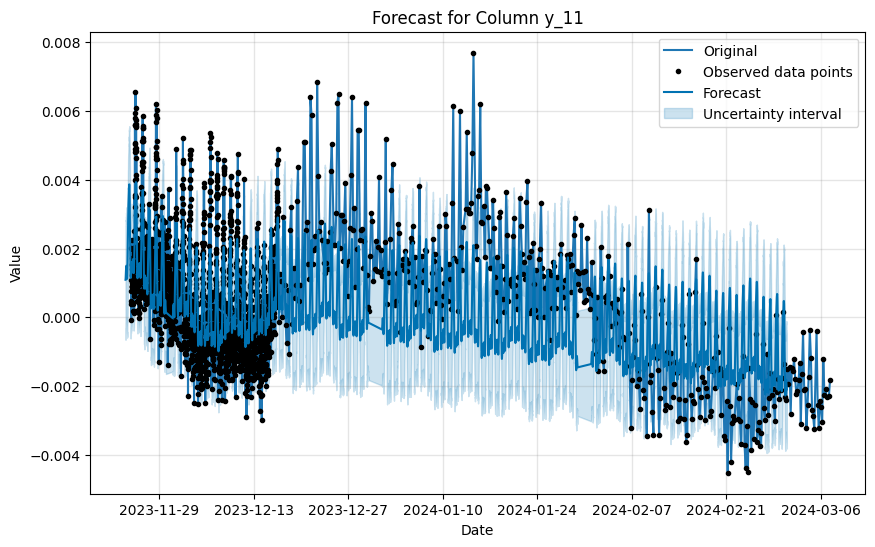

In [50]:
import pandas as pd
from pandas import to_datetime, DataFrame
from prophet import Prophet
from matplotlib import pyplot as plt
path = '/content/TM_combine_data.xlsx'
df = pd.read_excel(path, header=0)

columns_to_process = [df.columns[i:i+12] for i in range(0, len(df.columns), 12)]

future = []
for year in range(2023, 2024):
    for month in range(11, 12):
        for day in range(24, 30):
            for hour in range(0, 24):
                for minute in range(0, 60, 15):
                    date = f'{day:02d}-{month:02d}-{year:04d} {hour:02d}:{minute:02d}'
                    future.append([date])
for year in range(2023, 2024):
    for month in range(12, 13):
        for day in range(1, 30):
            for hour in range(0, 24):
                for minute in range(0, 60, 15):
                    date = f'{day:02d}-{month:02d}-{year:04d} {hour:02d}:{minute:02d}'
                    future.append([date])
for year in range(2024, 2025):
    for month in range(1, 3):
        for day in range(1, 30):
            for hour in range(0, 24):
                for minute in range(0, 60, 15):
                    date = f'{day:02d}-{month:02d}-{year:04d} {hour:02d}:{minute:02d}'
                    future.append([date])

future_df = DataFrame(future, columns=['ds'])
future_df['ds'] = to_datetime(future_df['ds'], format='%d-%m-%Y %H:%M')

for i, columns in enumerate(columns_to_process):
    if 'Date Time (UTC+08:00)' in columns:
        columns_to_keep = ['Date Time (UTC+08:00)'] + list(columns[1:13])
        df_subset = df[columns_to_keep].copy()
        df_subset.columns = ['ds'] + [f'y_{i}' for i in range(1, len(columns_to_keep))]

        # Iterating over each feature column and apply the model
        for j in range(1, len(df_subset.columns)):
            original_column_name = df_subset.columns[j]
            df_feature = df_subset[['ds', original_column_name]].copy()
            df_feature.columns = ['ds', 'y']

            # Convert 'ds' to datetime and drop rows with NaN values
            df_feature['ds'] = to_datetime(df_feature['ds'], errors='coerce')
            df_feature = df_feature.dropna(subset=['ds'])

            # Check for any NaN values in the 'ds' column
            if df_feature['ds'].isnull().any():
                print(f'Skipping column {original_column_name} due to NaN values in "ds" after conversion.')
                continue

            model = Prophet()
            model.fit(df_feature)

            # Make predictions
            forecast = model.predict(future_df)
            plt.figure(figsize=(10, 6))
            plt.plot(df_feature['ds'], df_feature['y'], label='Original')

            model.plot(forecast, ax=plt.gca(), xlabel='Date', ylabel='Value')
            plt.title(f'Forecast for Column {original_column_name}')
            plt.legend()
            plt.show()
